## Lets have M31 Galaxy fits Data from Astroquery

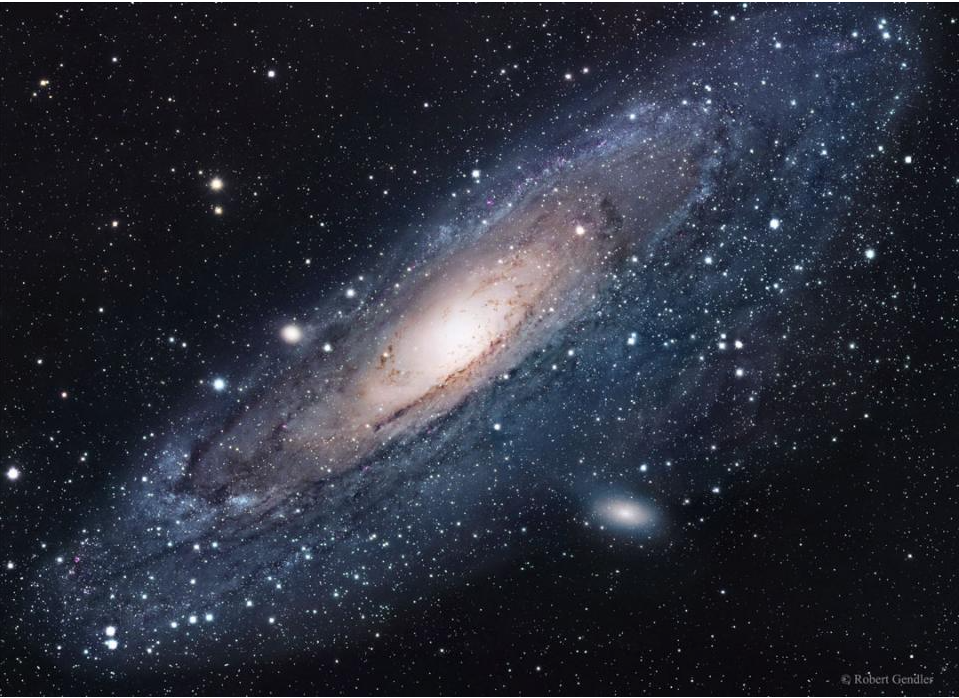

## 1) Installing Astroquery

In [ ]:
!pip install astroquery

## 2) Import necessary Libraries and Modules

In [ ]:
import matplotlib.pyplot as plt

### 3) Query for Astronomical Survey Images centered on target name

SkyView Query Form:- https://skyview.gsfc.nasa.gov/current/cgi/query.pl

<img src='http://www.messier-objects.com/wp-content/uploads/2015/04/Messier-32-Messier-31-and-Messier-110.jpg' width = 50%>

In [ ]:
from astroquery.skyview import SkyView

In [ ]:
hdu = SkyView.get_images("M31", "SDSSi")[0][0]

In [ ]:
hdu

## 4) Get into the data

In [ ]:
# Get the Metadata using header
M31_header = hdu.header

In [ ]:
# Get the pixels data from HDU
M31_Pixels = hdu.data

In [ ]:
# Check the type - must be numpy array
type(M31_Pixels)

numpy.ndarray

In [ ]:
# Check the shape of the array
M31_Pixels.shape

(300, 300)

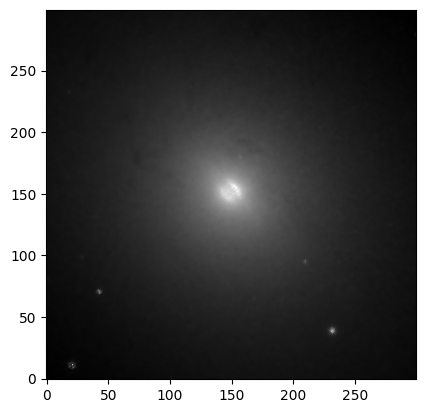

In [ ]:
# Plot the image
plt.imshow(M31_Pixels, cmap="gray", origin="lower")

In [ ]:
import astropy.units as u

In [ ]:
hdu = SkyView.get_images("M31", "DSS2 Blue",
                         pixels=600,
                         radius=150*u.arcmin)[0][0]

In [ ]:
M31_DSS2_Blue_Pixels = hdu.data

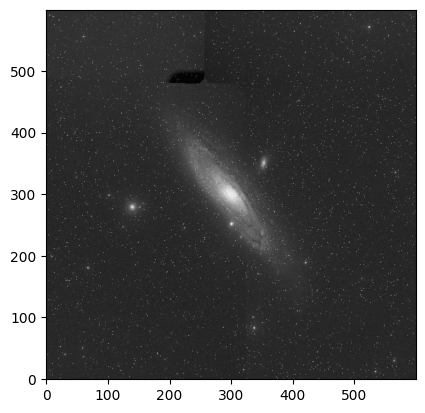

In [ ]:
plt.imshow(M31_DSS2_Blue_Pixels, cmap='gray', origin='lower')

## 5) Learn to create your own FITS file

In [ ]:
# Import fits from io module of astropy
from astropy.io import fits

In [ ]:
'''Steps to prepare data for FITS file'''
# 1) Create HDUList() to store different HDUs
hdulist = fits.HDUList()

# 2) Create the PrimaryHDU()
hdu1 = fits.PrimaryHDU()

# 3) Add Pixel data
hdu1.data = M31_Pixels

# 4) Add Meta data
hdu1.header = M31_header

# 5) Append this Primary HDU to the HDU List
hdulist.append(hdu1)

# 6) Generate the FITS data
hdulist.writeto("Dummy_FITS_file.fits")


In [ ]:
# Open the FITS data generated by you!
My_fits = fits.open('/content/Dummy_FITS_file.fits')

In [ ]:
# What's inside first index of our FITS data?
My_fits[0]

In [ ]:
# Check the header info
My_fits[0].header

SIMPLE  =                    T / Written by SkyView Sun Nov 09 22:47:46 EST 2025
BITPIX  =                  -32 / 4 byte floating point                          
NAXIS   =                    2 / Two dimensional image                          
NAXIS1  =                  300 / Width of image                                 
NAXIS2  =                  300 / Height of image                                
CRVAL1  =              10.6847 / Reference longitude                            
CRVAL2  =              41.2688 / Reference latitude                             
RADESYS = 'FK5     '           / Coordinate system                              
EQUINOX =               2000.0 / Epoch of the equinox                           
CTYPE1  = 'RA---TAN'           / Coordinates -- projection                      
CTYPE2  = 'DEC--TAN'           / Coordinates -- projection                      
CRPIX1  =                150.5 / X reference pixel                              
CRPIX2  =                150

In [ ]:
# Check the pixels using .data
My_fits[0].data

array([[18.71875, 18.75   , 18.875  , ..., 26.0625 , 25.59375, 25.84375],
       [18.90625, 18.71875, 19.15625, ..., 25.875  , 25.375  , 25.75   ],
       [19.09375, 19.03125, 19.25   , ..., 25.8125 , 25.625  , 25.75   ],
       ...,
       [25.3125 , 25.90625, 25.5    , ..., 19.15625, 19.15625, 19.71875],
       [25.28125, 25.53125, 25.21875, ..., 19.15625, 18.5    , 19.1875 ],
       [25.5    , 24.96875, 25.1875 , ..., 18.75   , 18.71875, 19.0625 ]],
      dtype='>f4')

In [ ]:
# Store it in a variable
dummy_data_var = My_fits[0].data

In [ ]:
# Get the shape
dummy_data_var.shape

(300, 300)

In [ ]:
# Get the type of the variable
type(dummy_data_var)

numpy.ndarray

## Pixel Scalling on M31 Data

In [ ]:
# Import necessary libraries to get started with Pixel Scalling
import numpy as np

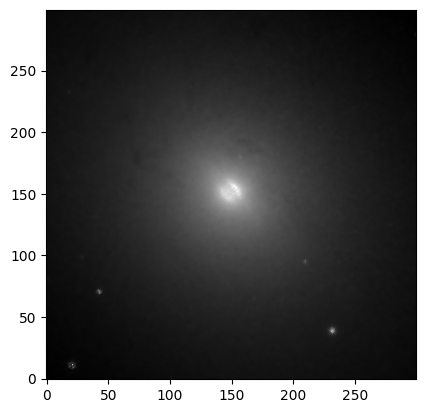

In [ ]:
# Visualizing M31_Pixels once again
plt.imshow(M31_Pixels, cmap='gray', origin='lower')

In [ ]:
# Printing the value of Pixel at the Centre of Andromeda Galaxy
print(M31_Pixels[151, 151])

179.25


In [ ]:
# Check some statistic (min, max, mean, std) of the data using numpy
print('Summary Statistics of M31 Pixels: ')
print('Minimum: ', np.min(M31_Pixels))
print('Maximum: ', np.max(M31_Pixels))
print('Mean: ', np.mean(M31_Pixels))
print('Standard Deviation: ', np.std(M31_Pixels))

Summary Statistics of M31 Pixels: 
Minimum:  18.5
Maximum:  219.0
Mean:  46.020832
Standard Deviation:  20.618496


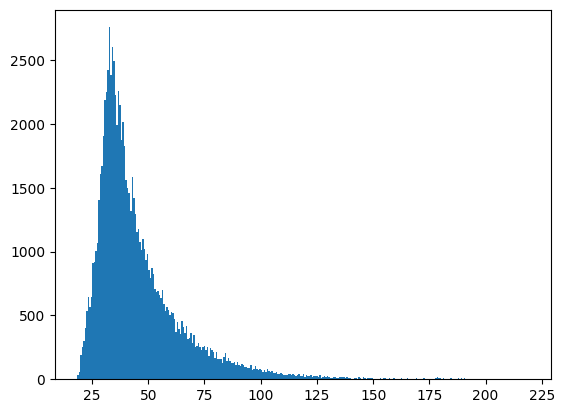

In [ ]:
# Get the histogram distrubution
plt.hist(M31_Pixels.flat, bins=300)
plt.show()

### 1) Intensity Normalization Or Linear Scaling Or Min Max Scaling

<img src='https://playfairdata.com/wp-content/uploads/2022/05/6.-minmax-calc.png' width=25%>

In [ ]:

# A Common Function that will be used to plot the scalr pixel arrays
def plot_pixels(pixel_array, title, color):
  plt.imshow(pixel_array, cmap='gray', origin='lower')
  plt.title(title, color=color, weight='bold')
  plt.axis('off')
  plt.show()

In [ ]:
def compare_pixels(scaled_array, title):
  plt.subplot(1,2,1)
  plot_pixels(M31_Pixels, title='Original Image', color='black')
  plt.subplot(1,2,2)
  plot_pixels(scaled_array, title=title, color='royalblue')
  plt.tight_layout()
  plt.show()


In [ ]:
# Define a function to normalize
def minmax_scaling(pixel_array):
  num = pixel_array - np.min(pixel_array)
  den = np.max(pixel_array) - np.min(pixel_array)
  return num/den

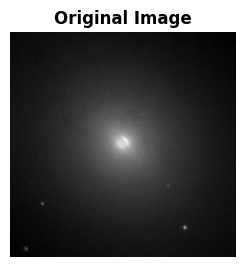

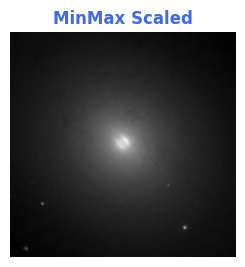

<Figure size 640x480 with 0 Axes>

In [ ]:
# Normalize the M31 data and visualize it!
minmax_array = minmax_scaling(M31_Pixels)
compare_pixels(minmax_array, title='MinMax Scaled')

### 2) Standardization Or Z scaling

<img src='https://tse2.mm.bing.net/th?id=OIP.aU-q_bfzwe1ObWyaU3CReQAAAA&pid=Api&P=0&h=180' width=15%>

In [ ]:
# A function to standardize
def zscale(pixel_array):
  num = pixel_array - np.mean(pixel_array)
  den = np.std(pixel_array)
  return num/den

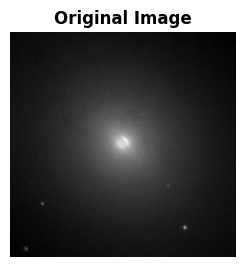

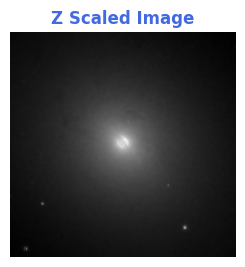

<Figure size 640x480 with 0 Axes>

In [ ]:
# Visualize the standardize data
zscaled_array = zscale(M31_Pixels)
compare_pixels(zscaled_array, title='Z Scaled Image')


### 3) Log Normalization

In [ ]:
# Log Normalization is simply the log of pixels! Create a function for the same!
def log_normalization(pixel_array):
  return np.log(pixel_array)

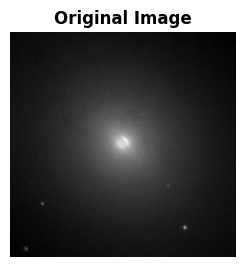

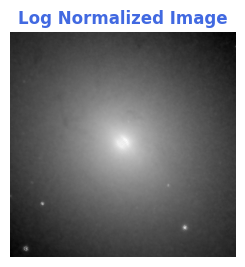

<Figure size 640x480 with 0 Axes>

In [ ]:
# Visualize the log normalization on M31 data
log_norm_array = log_normalization(M31_Pixels)
compare_pixels(log_norm_array, title='Log Normalized Image')

### 4) Create a Histogram Distribution of Pixels of the best output so far!

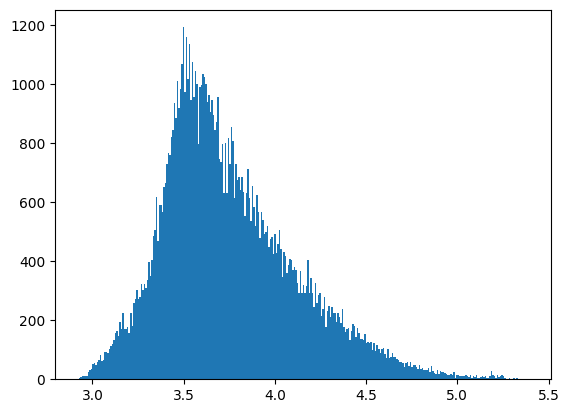

In [ ]:
# Let's proceed with this log normaization!
plt.hist(log_norm_array.flat, bins=300)
plt.show()

In [ ]:
# Get the shape
log_norm_array.shape

(300, 300)

## 5) Square Root


In [ ]:
def sqrt_scaling(pixel_array):
  return np.sqrt(pixel_array)

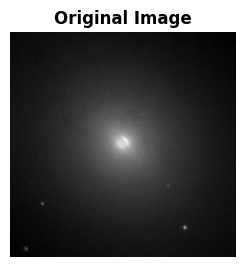

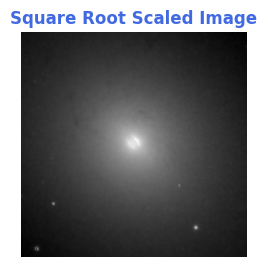

<Figure size 640x480 with 0 Axes>

In [ ]:
sqrt_array = sqrt_scaling(M31_Pixels)
compare_pixels(sqrt_array, title='Square Root Scaled Image')

#astropy.visualization Modules

### ZScaleInterval

In [ ]:
# Get the ZScaleInterval from Visualization Module of astropy
from astropy.visualization import ZScaleInterval

In [ ]:
# Create the object for ZScaleInterval
z = ZScaleInterval()

In [ ]:
# Get min and max values of M31 data
zmin, zmax = z.get_limits(log_norm_array)

In [ ]:
# Check z1 and z2
print(f'minimum value: {zmin}')
print(f'maximum value: {zmax}')

minimum value: 2.92952561378479
maximum value: 5.288267135620117


Text(0.5, 1.0, 'ZScale Interval')

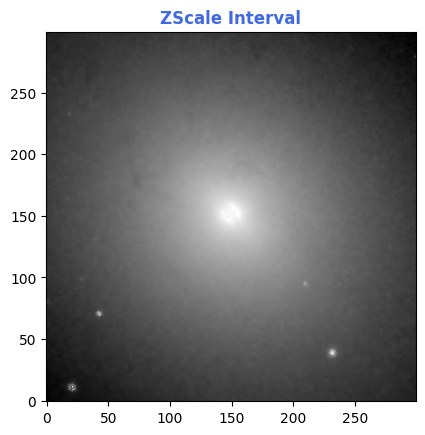

In [ ]:
# Plot the M31 data using this interval
img = plt.imshow(log_norm_array, vmin=zmin, vmax=zmax, cmap='gray', origin='lower')
plt.title('ZScale Interval', color='royalblue', weight='bold')

In [ ]:
# Get the array created from the above cell
image_array = img.make_image(renderer=None, unsampled=True)[0]

In [ ]:
# shape - check the channels
image_array.shape

(300, 300, 4)

**Note:-**
* Red, Green, Blue and Alpha channels makes up a 4 channel image

### Change 4 channel image to  grayscale

In [ ]:
# Import cv2 library - doesn't need installation using google colab
import cv2

In [ ]:
# Convert 4 channel image to grayscale image
gray_array = cv2.cvtColor(image_array, cv2.COLOR_BGRA2GRAY)

In [ ]:
# Check if channels are set to 3 or 4 now
gray_array.shape

(300, 300)

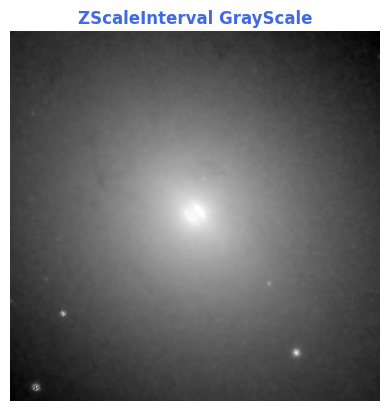

In [ ]:
# Visualize it
plot_pixels(gray_array, title='ZScaleInterval GrayScale', color='royalblue')

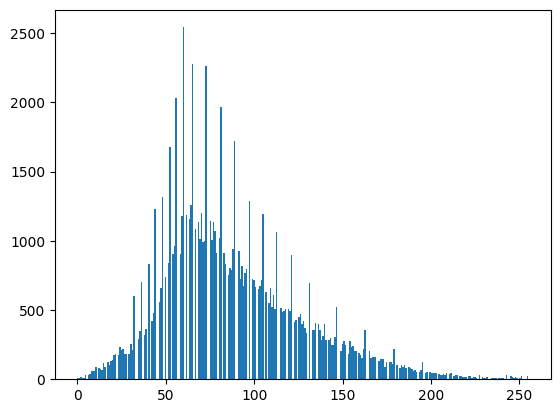

In [ ]:
# Histogram Visualization
plt.hist(gray_array.flat, bins=300)
plt.show()

In [ ]:
# Store grayscale in a new variable(will be using it later)
grayscale_zint_array = gray_array

#Denoising using Gaussian

It is technically Blurring the image by removing noises...Which is prerequisite to many filters and this is known as Gaussian Smoothing.

**<u>Convolution</u>:-**       
<img src='https://miro.medium.com/max/1400/1*O06nY1U7zoP4vE5AZEnxKA.gif' width=50%>

In [ ]:
# We will need convolution 2D filter from Scipy's signal module
from scipy.signal import convolve2d

In [ ]:
# Generate your kernel/filter
kernel = np.ones((3,3))/9

In [ ]:
# Let's see how it looks
kernel

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

In [ ]:
# Create a gaussian kernel
gaussian_kernel = np.array([[1/16, 1/8, 1/16],
                            [1/8, 1/4, 1/8],
                            [1/16, 1/8, 1/16]])

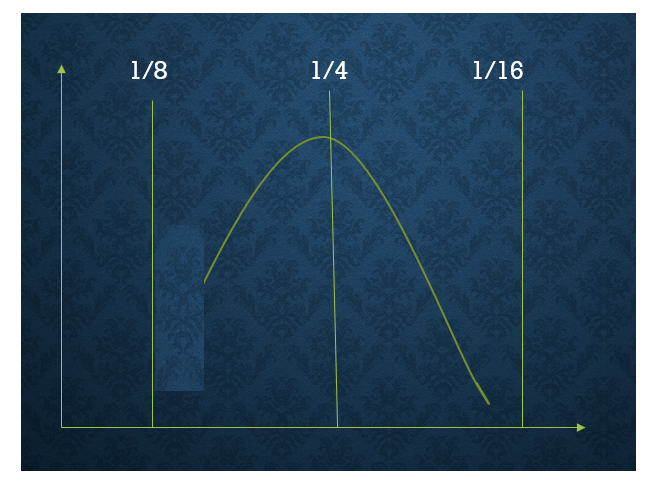

In [ ]:
# Get the convolution done using our kernel
convolved_image = convolve2d(M31_Pixels, kernel, mode='same')

In [ ]:
# Convolution done using gaussian kernel
gaussian_convolved_image = convolve2d(M31_Pixels, gaussian_kernel, mode='same')


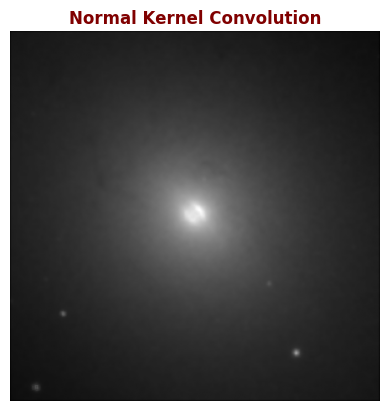

In [ ]:
# Vizulaise the first kernel convolution
plot_pixels(convolved_image, title='Normal Kernel Convolution', color='maroon')


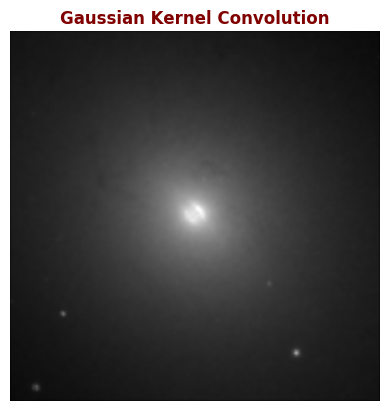

In [ ]:
# Visualize the gaussian kernel convolved output
plot_pixels(gaussian_convolved_image, title='Gaussian Kernel Convolution', color='maroon')


In [ ]:
# Using grayscalel of M31 data to convolve with gaussian kernel
convolved_grayscale = convolve2d(grayscale_zint_array, gaussian_kernel, mode='same')

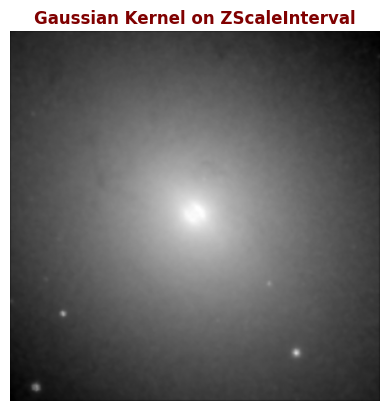

In [ ]:
# Check how this looks now!
plot_pixels(convolved_grayscale, title='Gaussian Kernel on ZScaleInterval', color='maroon')

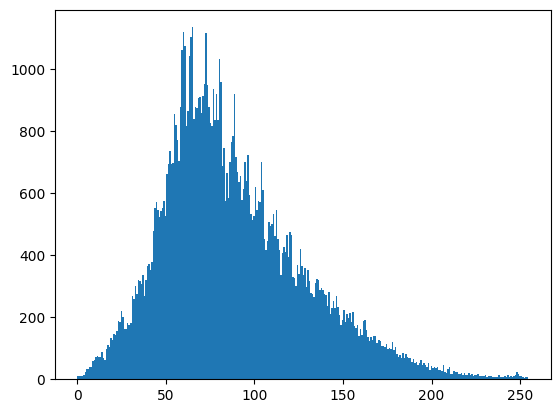

In [ ]:
# Get the histogram
plt.hist(convolved_grayscale.flat, bins=300)
plt.show()

## Enhancing the Linear Features on M31
Take a look onto different available filters in skimage:-
https://scikit-image.org/docs/stable/api/skimage.filters.html

In [91]:
# Create spectral list to use later
SPECTRAL_LIST = ["gray","jet","hot","prism","nipy_spectral"]

In [87]:
# Import meijering and sato filters from skimage
from skimage.filters import meijering, sato

In [88]:
# Implement these filters on the covolved image
meijering_output = meijering(convolved_grayscale)
sato_output = sato(convolved_grayscale)

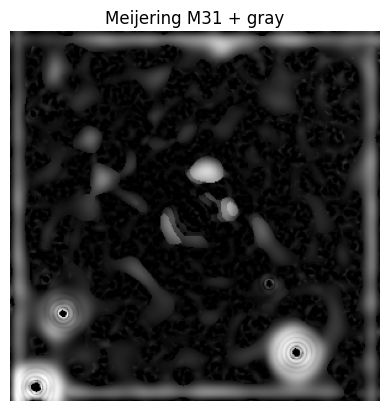

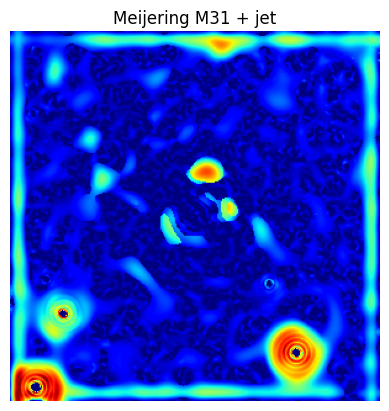

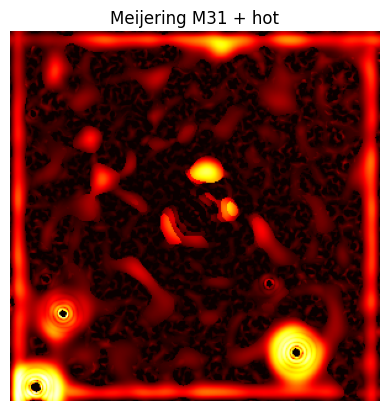

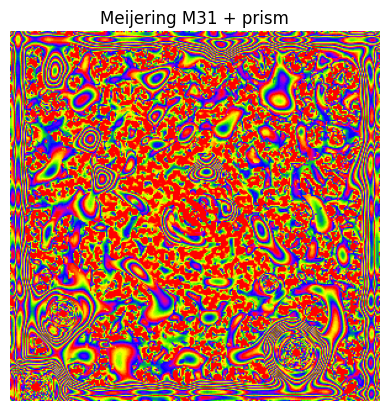

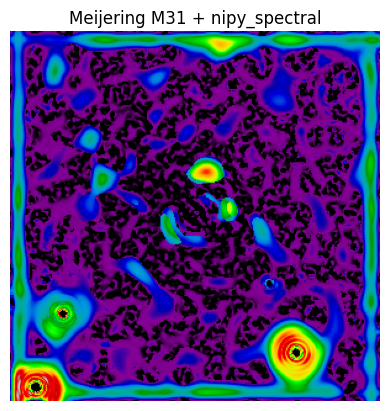

In [92]:
# For each element in the spectral list visulize the output for the meijering filer!
for colormap in SPECTRAL_LIST:
  plt.imshow(meijering_output, cmap=colormap, origin='lower')
  plt.title(f'Meijering M31 + {colormap}')
  plt.axis('off')
  plt.show()

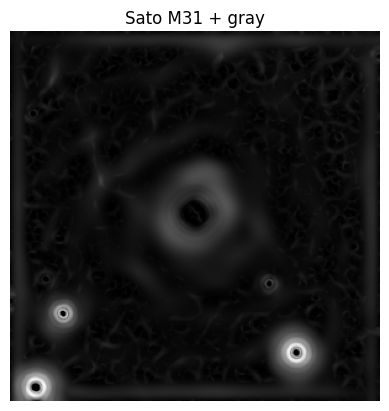

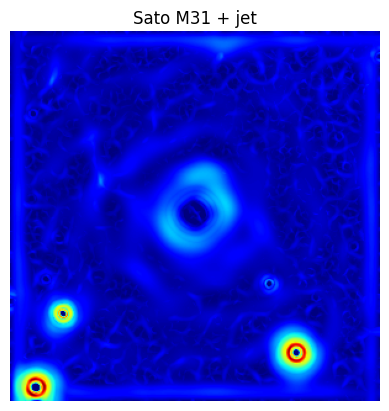

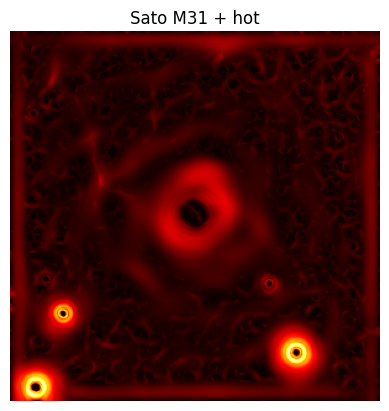

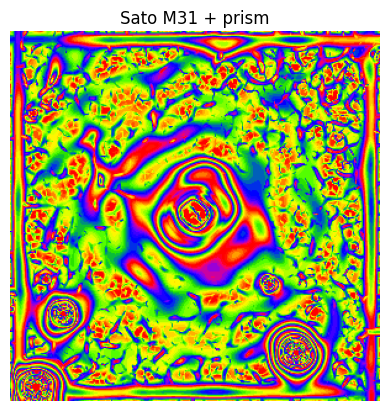

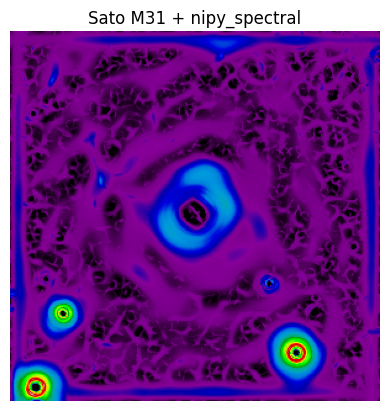

In [93]:
# For each element in the spectral list visulize the output for the sato filer!
for colormap in SPECTRAL_LIST:
  plt.imshow(sato_output, cmap=colormap, origin='lower')
  plt.title(f'Sato M31 + {colormap}')
  plt.axis('off')
  plt.show()


## Feature Detection and Extraction

skiamge different features:- https://scikit-image.org/docs/stable/api/skimage.feature.html

Skimage Feature used for Feature detection and extraction, e.g., texture analysis corners, etc.

### corner_foerstner

A fast operator for detection and precise location of distinct points, corners and centres of circular features

In [94]:
# Import feature module from skimage
from skimage.feature import corner_foerstner

In [95]:
# log_scaled pixels or standard scale pixes or Normalized pixels
feature_output = corner_foerstner(convolved_grayscale)

In [96]:
# Check the output of the featured image
feature_output[1]

array([[0.24582553, 0.22492551, 0.2307736 , ..., 0.25337692, 0.66131869,
        0.71392495],
       [0.3423523 , 0.26899541, 0.25083658, ..., 0.55396655, 0.90413197,
        0.65333048],
       [0.25503137, 0.16132205, 0.12739172, ..., 0.98363581, 0.54468247,
        0.24191102],
       ...,
       [0.23392232, 0.53150523, 0.93736726, ..., 0.20057369, 0.34230356,
        0.42989413],
       [0.64382691, 0.88760756, 0.52571529, ..., 0.19469682, 0.35519325,
        0.5357822 ],
       [0.70867685, 0.6442406 , 0.22973553, ..., 0.14857948, 0.26926783,
        0.40519812]])

In [97]:
# Type of the featured image
type(feature_output)

tuple

In [98]:
# Check the length of the tuple
len(feature_output)

2

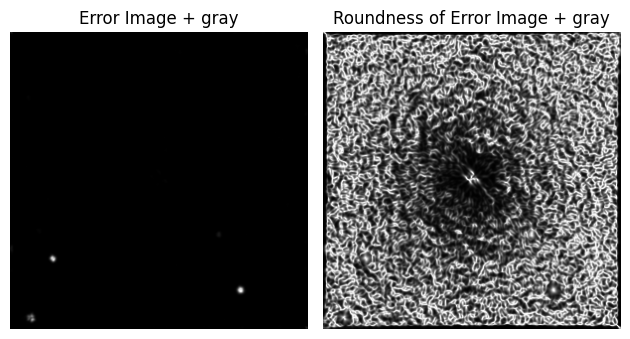

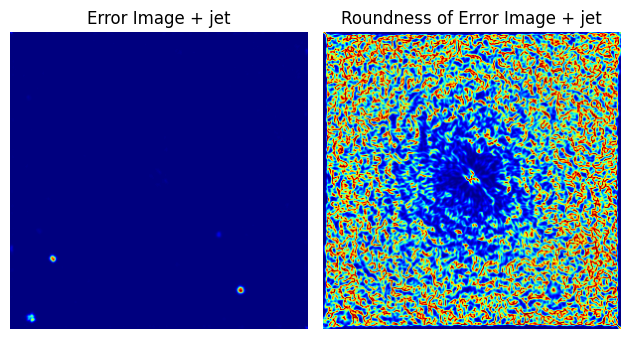

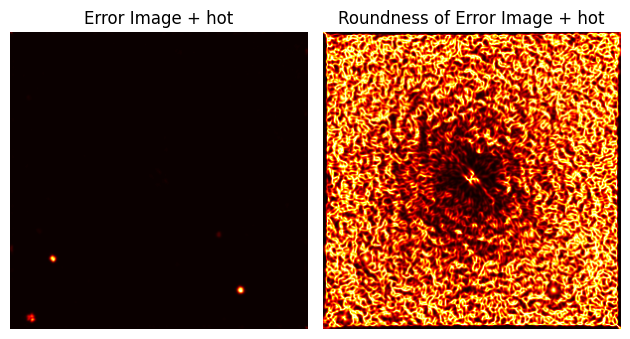

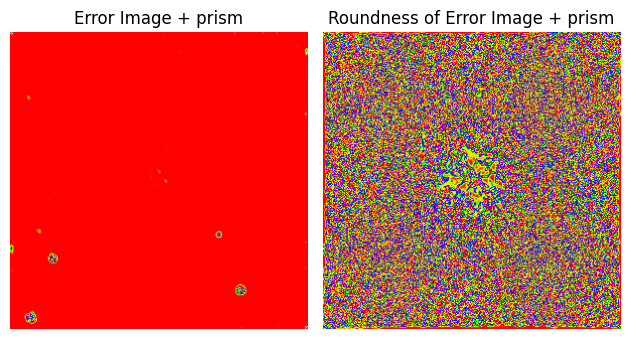

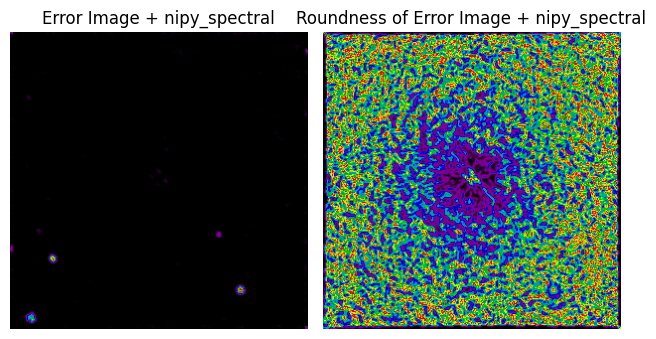

In [99]:
# Subplot Visualization
for colormap in SPECTRAL_LIST:
  plt.subplot(1, 2, 1)
  plt.imshow(feature_output[0], cmap=colormap, origin='lower')
  plt.title(f'Error Image + {colormap}')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(feature_output[1], cmap=colormap, origin='lower')
  plt.title(f'Roundness of Error Image + {colormap}')
  plt.axis('off')

  plt.tight_layout()
  plt.show()


### multiscale_basic_features (Local Features)

In [100]:
# Import this feature
from skimage.feature import multiscale_basic_features

In [101]:
# Generate again a new featured image
featured_image = multiscale_basic_features(convolved_grayscale)


In [103]:
# Get type
type(featured_image)

numpy.ndarray

In [104]:
# Shape
featured_image.shape

(300, 300, 24)

In [105]:
# Storing each and every channel from P1 to P24
cv2.split(featured_image)

(array([[ 0.1807193 ,  0.29157364,  0.78470916, ..., 26.206234  ,
         25.325132  , 20.338993  ],
        [ 0.58650255,  0.85225683,  1.7428722 , ..., 32.94      ,
         31.83846   , 25.468948  ],
        [ 0.95342886,  1.2161776 ,  2.3387363 , ..., 34.226227  ,
         33.151787  , 26.42189   ],
        ...,
        [25.293428  , 32.029346  , 33.04315   , ...,  2.9945776 ,
          2.2961462 ,  2.081219  ],
        [24.331198  , 30.561172  , 31.40971   , ...,  1.7636776 ,
          1.3203341 ,  1.3578609 ],
        [19.194641  , 24.015333  , 24.811378  , ...,  0.69983506,
          0.4984151 ,  0.58029747]], dtype=float32),
 array([[0.3316335 , 0.68437517, 1.6207135 , ..., 4.748072  , 6.245435  ,
         5.404369  ],
        [0.59515077, 1.059865  , 2.2191017 , ..., 5.728663  , 7.2976327 ,
         6.319547  ],
        [0.26501042, 1.0484904 , 2.5299227 , ..., 1.1506039 , 5.4718423 ,
         4.783185  ],
        ...,
        [4.881075  , 5.739196  , 2.287508  , ..., 2.20054

In [106]:
len(cv2.split(featured_image))

24

In [107]:
P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24 = cv2.split(featured_image)

In [108]:
# Check P1
P1.shape

(300, 300)

In [109]:
# What about last one - P24
P24.shape

(300, 300)

In [110]:
# Create list of these pixels for each channel
Pixels = [P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24]

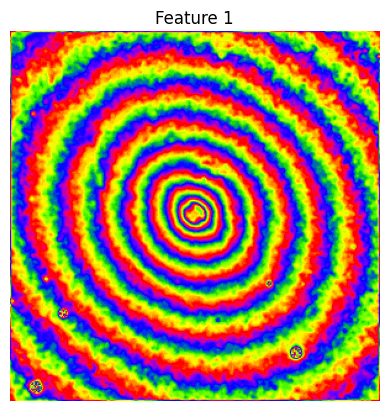

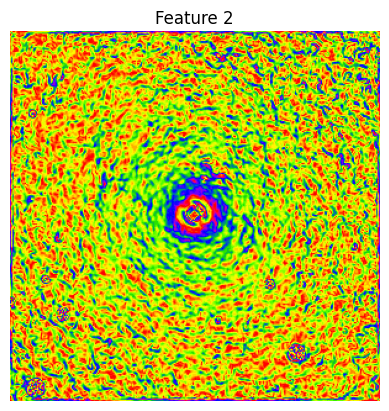

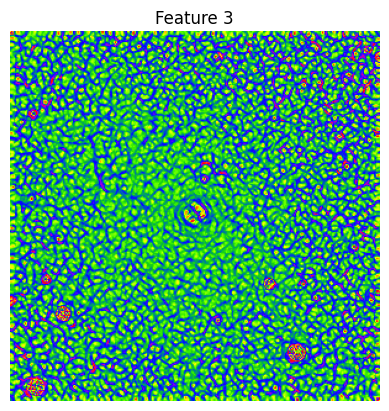

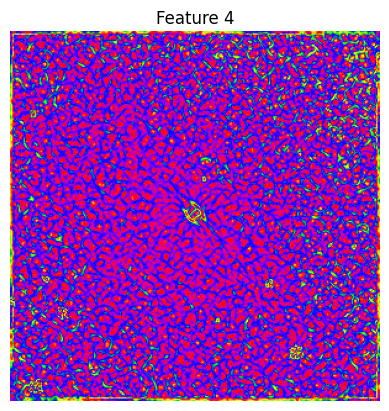

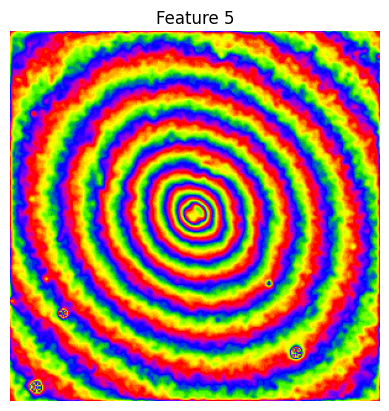

...

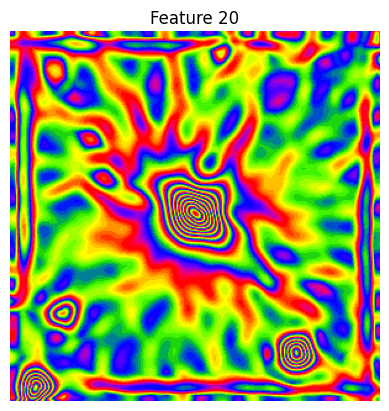

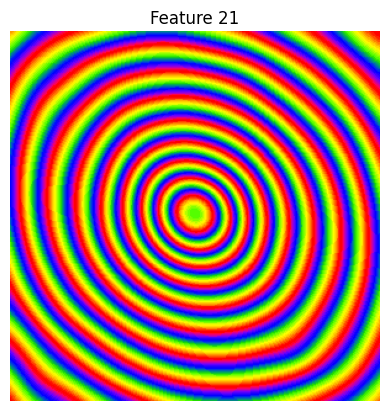

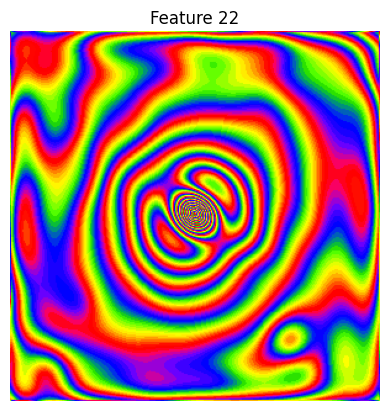

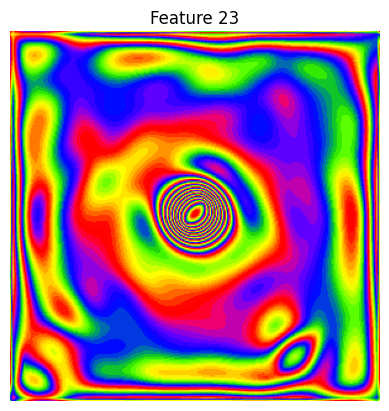

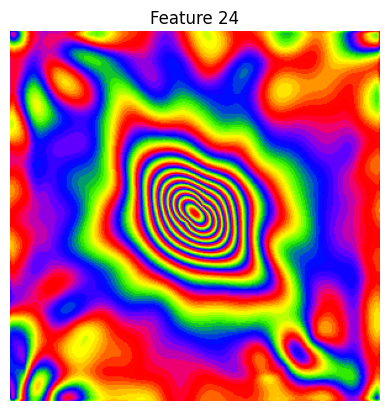

In [111]:
# Visualize each channel using prism spectral
for i, feature in enumerate(Pixels):
  plt.imshow(feature, cmap='prism', origin='lower')
  plt.title(f'Feature {i+1}')
  plt.axis('off')
  plt.show()


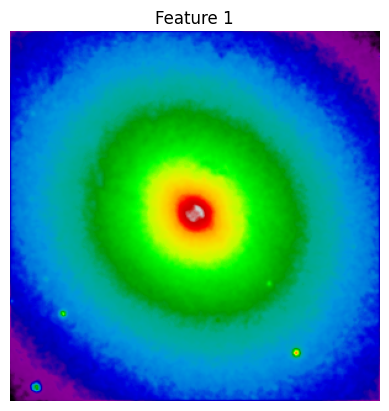

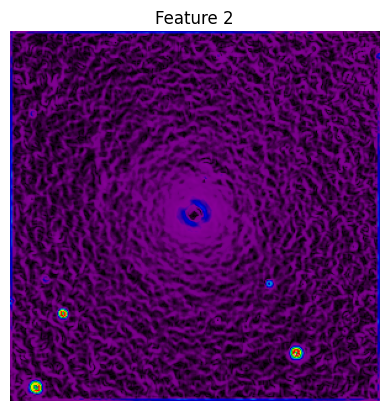

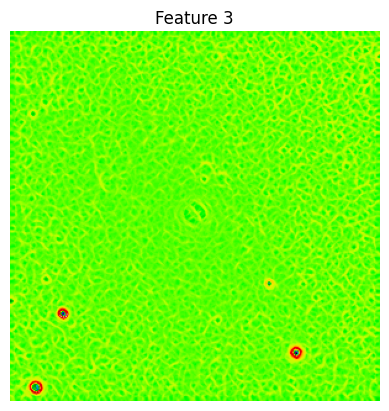

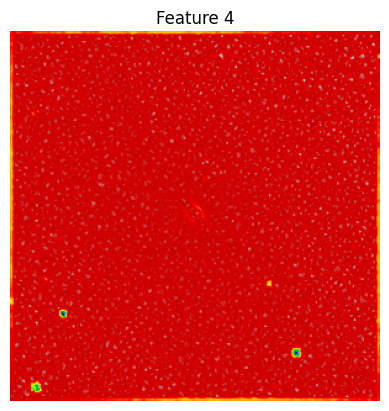

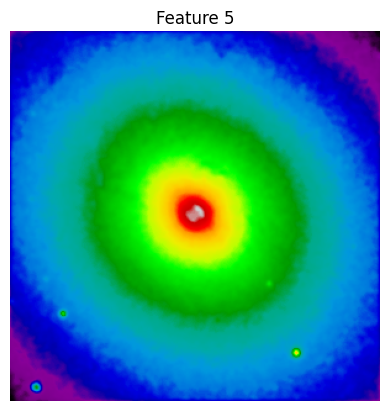

...

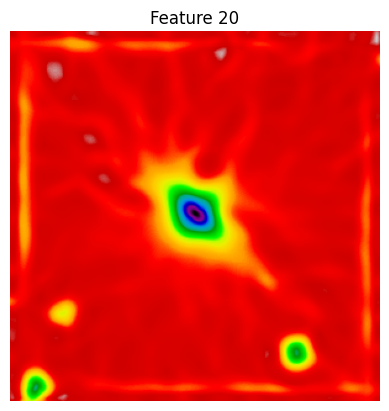

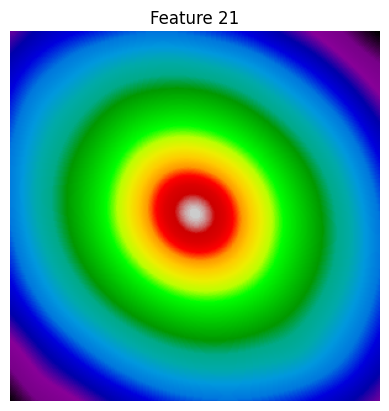

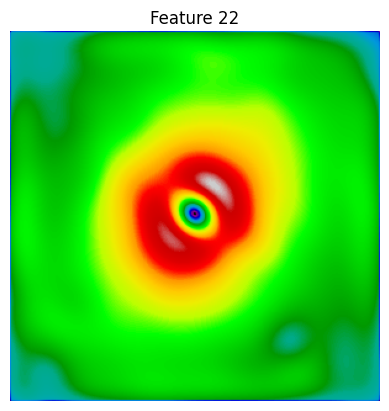

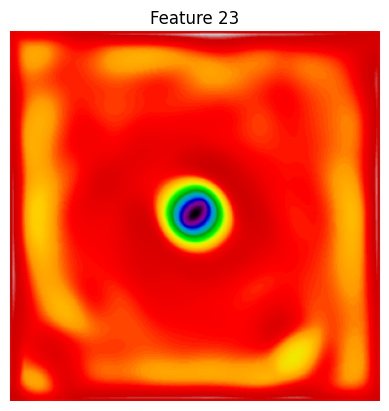

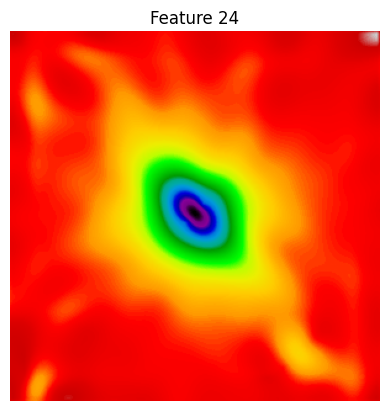

In [113]:
for i, feature in enumerate(Pixels):
  plt.imshow(feature, cmap='nipy_spectral', origin='lower')
  plt.title(f'Feature {i+1}')
  plt.axis('off')
  plt.show()
